# The UCI Wine Quality dataset

## Group Notice

**TLDR:**

1. Image notice:

If you want to change the image size of the decision tree, the setting below is for you, otherwise, **ignore this part**:

If you want large image, run the section set image to large in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.

If you want smaller image, run the section set image to small in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.

If you want everything return to default setting, either re-run the notebook or run the section set image to normal in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.


2. Data notice:

If you just want to see the result, **ignore this part**.

In case you want to re-run this notebook:

If everything seems normal, ignore this.
Otherwise, the server may be down, run the section at the end. Then ignore the import datasets section of 2.1 and run everything else as normal.

**Note:**

The process of making this notebook took quite a while, we had encountered multiple instances of the ics server dying. The last iteration has been run by the dataset in the archive.ics.uci.edu, however, if you rerun this code and find the server dying, in the end of the notebook we provide a section to take the dataset from a zip file in google drive, run that section and ignore the import datasets section of 2.1. The rest can be execute as normal.

The decision tree is big. We have to sacrifice text readability in exchange for structural clarity. The default size of the figure is chosen as it keep the text readable enough while still give the reader a grasp of the tree structure. However, in case the reader need more details of the node or want a clearer overview of the decision tree, we still give them the option to change the image size (The notebook need to be rerun, sadly). This can be accomplish by running one and only one of the subsection in the toggle figure size section.

If you want large image, run the section set image to large in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.

If you want smaller image, run the section set image to small in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.

If you want everything return to default setting, either re-run the notebook or run the section set image to normal in toggle figure size, ignore everything else in toggle figure size section and run everything as normal.

If you want to change the default size (the size if you run the whole notebook in one go). Change the parameter in the manual setting subsection in the toggle figure size section. More description in the comment of that block.

Thank you.

### Toggle figure size

####Set size to large

In [ ]:
setSizeOfGraph = 0

####Set size to normal

In [ ]:
setSizeOfGraph = 1

####Set size to small

In [ ]:
setSizeOfGraph = 2

####Manual setting:

In [ ]:
setSizeOfGraph = 1
#0: Original graph, verybig, useful if you need to know the details of each node
#1: Default graph, easier to see, text is somewhat readable, default
#2: Resize to fit the view window, text is almost unreadable
#Other value: Same as 0

## 2.1 Datasets preparing

### Dependencies

In [ ]:
!pip install ucimlrepo
!pip install scikit-learn
!pip install zipfile
!pip install pandas
!pip install numpy
!pip install graphviz
!pip install pydotplus
!pip install seaborn
!pip install matplotlib

ERROR: Could not find a version that satisfies the requirement zipfile (from versions: none)
ERROR: No matching distribution found for zipfile


### Import Datasets

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
wine_quality = fetch_ucirepo(id=186)

# data (as pandas dataframes)
features = wine_quality.data.features
labels = wine_quality.data.targets
dataa = wine_quality.data.original

#print(dataa)

colors = dataa['color']

# metadata
print(wine_quality.metadata)

# variable information
print(wine_quality.variables)

print(features)

print(labels)

print(colors)

{'uci_id': 186, 'name': 'Wine Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/186/wine+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/186/data.csv', 'abstract': 'Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).', 'area': 'Business', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 4898, 'num_features': 11, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['quality'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Wed Nov 15 2023', 'dataset_doi': '10.24432/C56S3T', 'creators': ['Paulo Cortez', 'A. Cerdeira', 'F. Almeida', 'T. Matos', 'J. Reis'], 'intro_paper': {'ID': 252, 'type': 'NATIVE', 'title': 'Modeling wine preferences

In [ ]:
idx = colors[colors == 'white'].index

features = features.loc[idx]
labels = labels.loc[idx]

print(features)
print(labels)

      fixed_acidity  volatile_acidity  citric_acid  residual_sugar  chlorides  \
1599            7.0              0.27         0.36            20.7      0.045   
1600            6.3              0.30         0.34             1.6      0.049   
1601            8.1              0.28         0.40             6.9      0.050   
1602            7.2              0.23         0.32             8.5      0.058   
1603            7.2              0.23         0.32             8.5      0.058   
...             ...               ...          ...             ...        ...   
6492            6.2              0.21         0.29             1.6      0.039   
6493            6.6              0.32         0.36             8.0      0.047   
6494            6.5              0.24         0.19             1.2      0.041   
6495            5.5              0.29         0.30             1.1      0.022   
6496            6.0              0.21         0.38             0.8      0.020   

      free_sulfur_dioxide  

###Grouping classes

In [ ]:
import pandas as pd

labels['quality_category'] = pd.cut(labels['quality'], bins=[-1, 4, 6, 10], labels=['Low Quality', 'Standard  Quality', 'High Quality'], right=True)

labels = labels.drop(columns=['quality'])

labels

,quality_category
1599,Standard Quality
1600,Standard Quality
1601,Standard Quality
1602,Standard Quality
1603,Standard Quality
...,...
6492,Standard Quality
6493,Standard Quality
6494,Standard Quality
6495,High Quality


### Class Distribution

#### Original Dataset

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


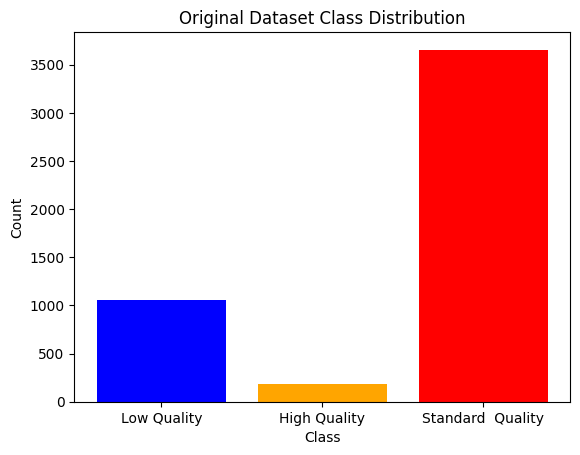

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Function to create stratified train/test splits
def create_splits(features, labels, test_sizes):
    splits = []
    for test_size in test_sizes:
        features_train, features_test, labels_train, labels_test = train_test_split(
            features, labels, test_size=test_size, stratify=labels, random_state=42
        )
        splits.append((features_train, features_test, labels_train, labels_test))
    return splits

# Define train/test proportions
test_sizes = [0.6, 0.4, 0.2, 0.1]
splits = create_splits(features, labels, test_sizes)

# Function to visualize class distributions
def plot_class_distribution(labels, title):
    unique, counts = np.unique(labels, return_counts=True)
    class_names = ['Low Quality', 'High Quality', 'Standard  Quality']
    plt.bar(class_names, counts, color=['blue', 'orange', 'red'])
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.show()

# Plot class distribution for the original dataset
plot_class_distribution(labels, "Original Dataset Class Distribution")

# Visualize class distributions for each train/test split
#for i, (features_train, features_test, labels_train, labels_test) in enumerate(splits):
#    proportion = f"{int((1 - test_sizes[i]) * 100)}/{int(test_sizes[i] * 100)}"
#    plot_class_distribution(labels_train, f"Training Set Class Distribution ({proportion})")
#    plot_class_distribution(labels_test, f"Test Set Class Distribution ({proportion})")


#### 40/60 Dataset

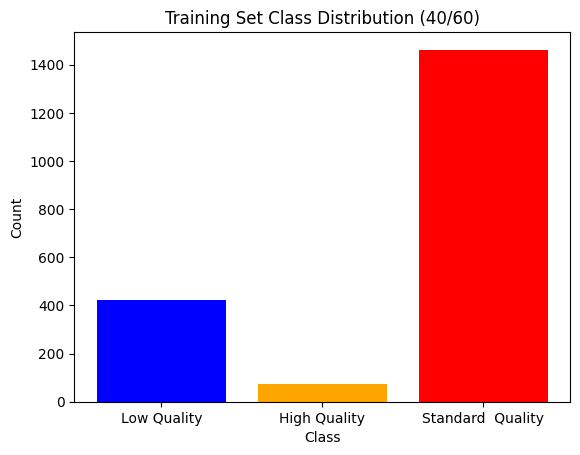

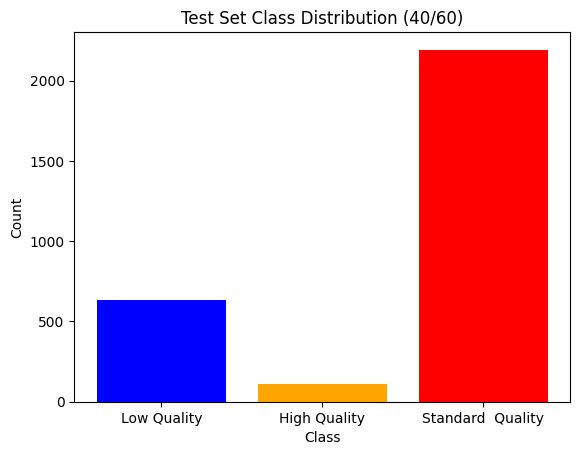

In [ ]:
i = 0
features_train, features_test, labels_train, labels_test = splits[i]
proportion = f"{int((1 - test_sizes[i]) * 100)}/{int(test_sizes[i] * 100)}"
plot_class_distribution(labels_train, f"Training Set Class Distribution ({proportion})")
plot_class_distribution(labels_test, f"Test Set Class Distribution ({proportion})")

#### 60/40 Dataset

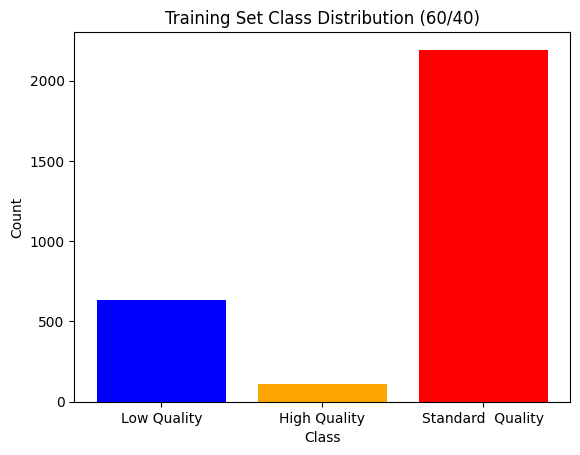

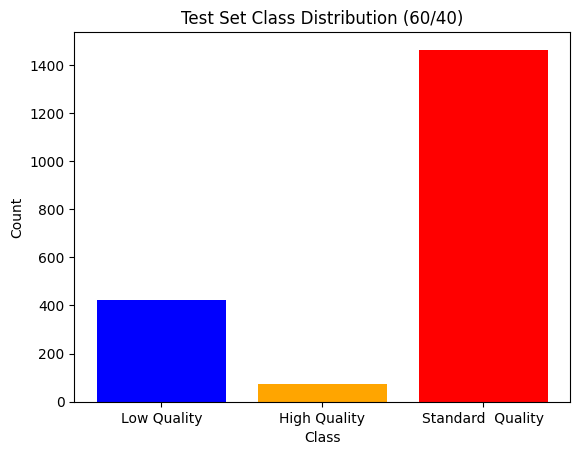

In [ ]:
i = 1
features_train, features_test, labels_train, labels_test = splits[i]
proportion = f"{int((1 - test_sizes[i]) * 100)}/{int(test_sizes[i] * 100)}"
plot_class_distribution(labels_train, f"Training Set Class Distribution ({proportion})")
plot_class_distribution(labels_test, f"Test Set Class Distribution ({proportion})")

####80/20 Dataset

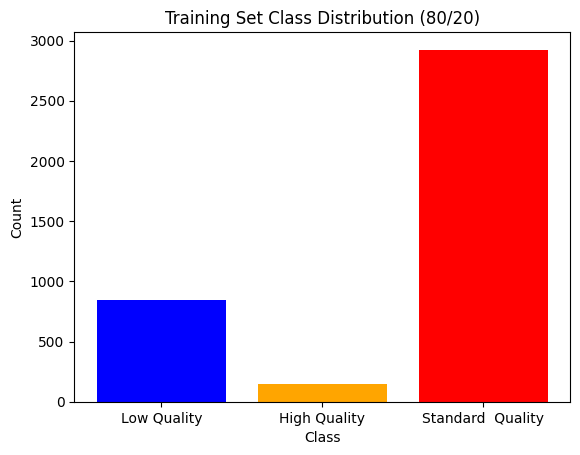

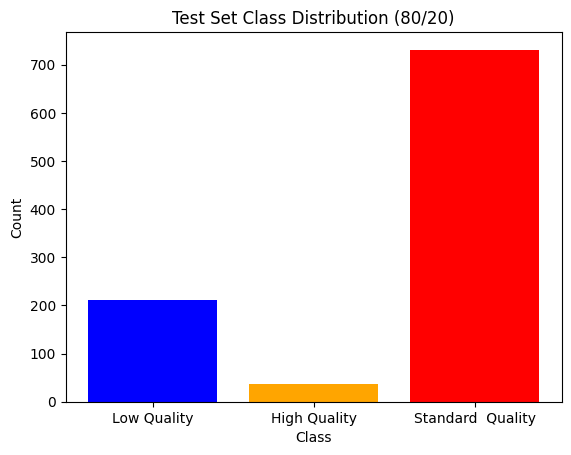

In [ ]:
i = 2
features_train, features_test, labels_train, labels_test = splits[i]
proportion = f"{int((1 - test_sizes[i]) * 100)}/{int(test_sizes[i] * 100)}"
plot_class_distribution(labels_train, f"Training Set Class Distribution ({proportion})")
plot_class_distribution(labels_test, f"Test Set Class Distribution ({proportion})")

####90/10 Dataset

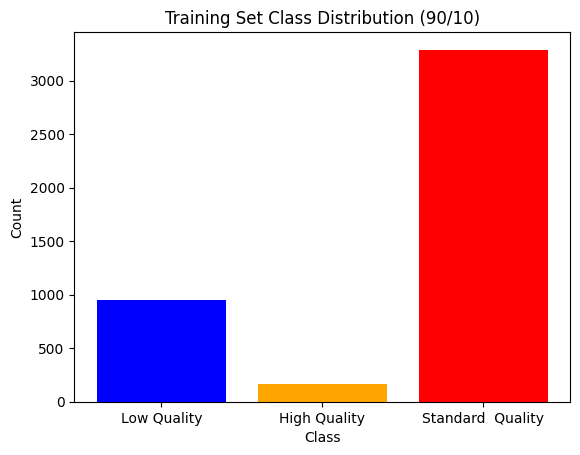

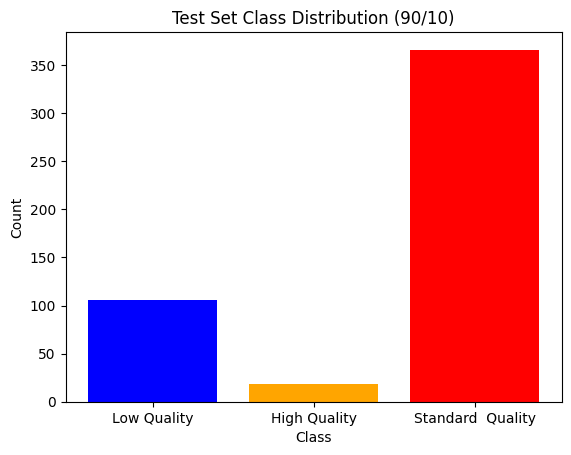

In [ ]:
i = 3
features_train, features_test, labels_train, labels_test = splits[i]
proportion = f"{int((1 - test_sizes[i]) * 100)}/{int(test_sizes[i] * 100)}"
plot_class_distribution(labels_train, f"Training Set Class Distribution ({proportion})")
plot_class_distribution(labels_test, f"Test Set Class Distribution ({proportion})")

## 2.2 Decision Tree

In [ ]:
!apt-get install graphviz

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [ ]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
import pydotplus
from IPython.display import display

def build_and_visualize_decision_trees(splits, proportions):
    classifier = []
    for i, (X_train, X_test, y_train, y_test) in enumerate(splits):
        proportion = proportions[i]
        clf = DecisionTreeClassifier(criterion='entropy', random_state=42)
        clf.fit(X_train, y_train)
        classifier.append((clf, X_train, X_test, y_train, y_test))

        feature_names = list(X_train.columns)

        class_names = ['Low Quality', 'High Quality', 'Standard  Quality']
        dot_data = export_graphviz(
            clf,
            feature_names=feature_names,
            class_names=class_names,
            filled=True
        )

        pydot_graph = pydotplus.graph_from_dot_data(dot_data)

        if (setSizeOfGraph == 1):
          pydot_graph.set_size('"200,15!"')
        elif (setSizeOfGraph == 2):
          pydot_graph.set_size('"40,3!"')
        graph = graphviz.Source(pydot_graph.to_string())

        display(graph)
    return classifier

proportions = ["40/60", "60/40", "80/20", "90/10"]
classifiers = []

###40/60 Dataset

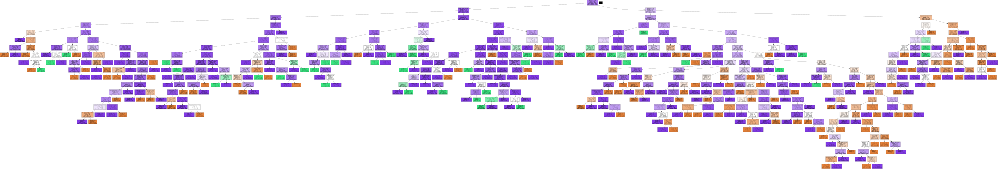

In [ ]:
i=0
classifiers.extend(build_and_visualize_decision_trees([splits[i]], [proportions[i]]))

###60/40 Dataset

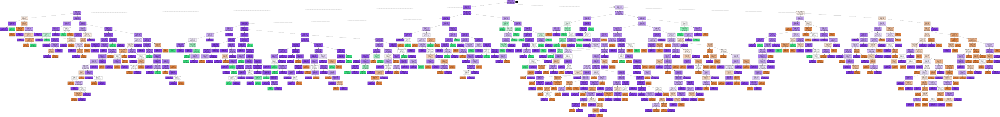

In [ ]:
i=1
classifiers.extend(build_and_visualize_decision_trees([splits[i]], [proportions[i]]))

###80/20 Dataset

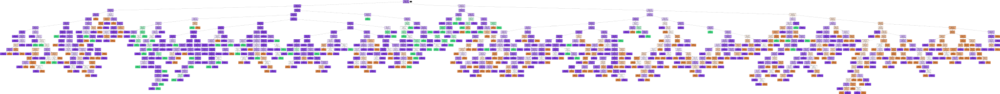

In [ ]:
i=2
classifiers.extend(build_and_visualize_decision_trees([splits[i]], [proportions[i]]))

###90/10 Dataset

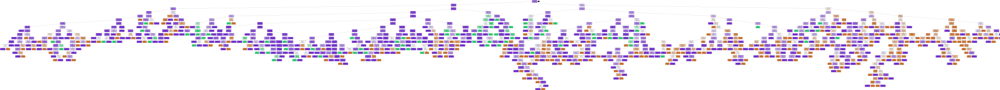

In [ ]:
i=3
classifiers.extend(build_and_visualize_decision_trees([splits[i]], [proportions[i]]))

## 2.3 Evaluating the decision tree classifiers

Classification Report for  {'40/60'}  Split :
                   precision    recall  f1-score   support

      Low Quality       0.52      0.53      0.53       636
     High Quality       0.22      0.20      0.21       110
Standard  Quality       0.83      0.83      0.83      2193

         accuracy                           0.74      2939
        macro avg       0.52      0.52      0.52      2939
     weighted avg       0.74      0.74      0.74      2939

[[ 339    8  289]
 [   8   22   80]
 [ 308   70 1815]]


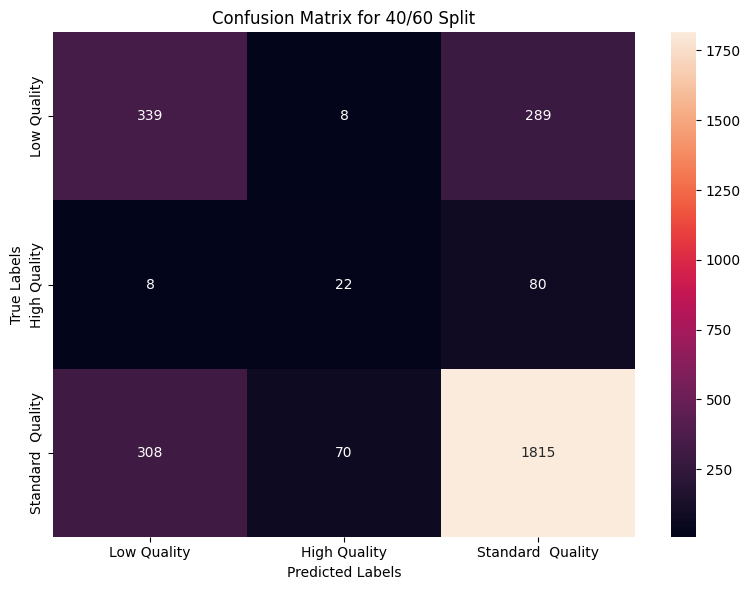




Classification Report for  {'60/40'}  Split :
                   precision    recall  f1-score   support

      Low Quality       0.58      0.61      0.59       424
     High Quality       0.29      0.33      0.31        73
Standard  Quality       0.86      0.84      0.85      1463

         accuracy                           0.77      1960
        macro avg       0.58      0.59      0.58      1960
     weighted avg       0.78      0.77      0.78      1960

[[ 257    8  159]
 [   8   24   41]
 [ 178   52 1233]]


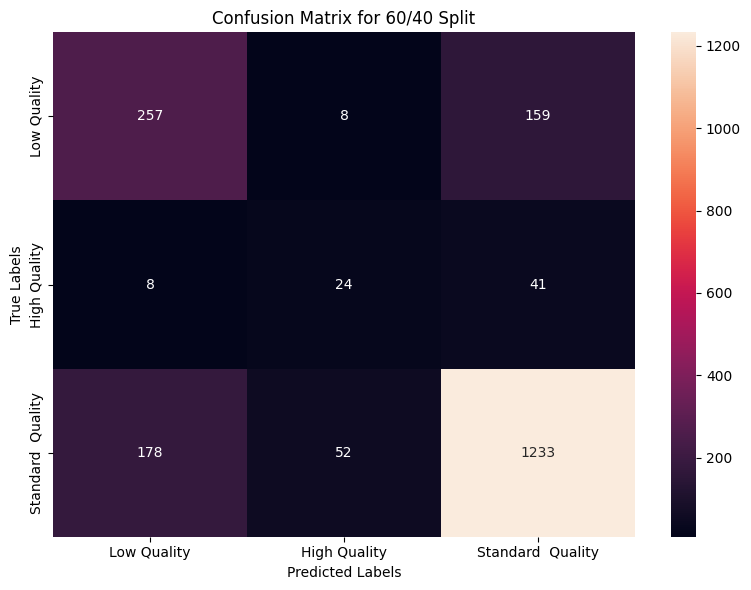




Classification Report for  {'80/20'}  Split :
                   precision    recall  f1-score   support

      Low Quality       0.56      0.58      0.57       212
     High Quality       0.42      0.41      0.41        37
Standard  Quality       0.86      0.85      0.85       731

         accuracy                           0.78       980
        macro avg       0.61      0.61      0.61       980
     weighted avg       0.78      0.78      0.78       980

[[124   4  84]
 [  3  15  19]
 [ 93  17 621]]


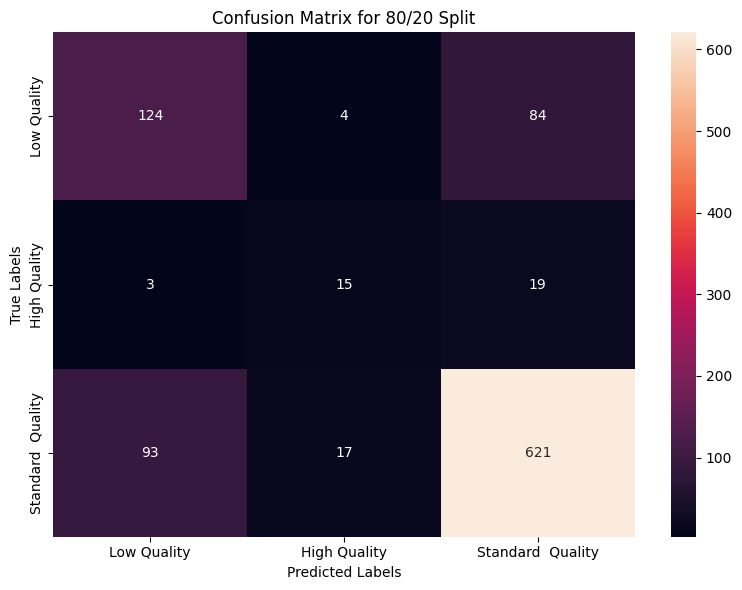




Classification Report for  {'90/10'}  Split :
                   precision    recall  f1-score   support

      Low Quality       0.60      0.64      0.62       106
     High Quality       0.39      0.39      0.39        18
Standard  Quality       0.87      0.85      0.86       366

         accuracy                           0.79       490
        macro avg       0.62      0.63      0.62       490
     weighted avg       0.79      0.79      0.79       490

[[ 68   0  38]
 [  2   7   9]
 [ 43  11 312]]


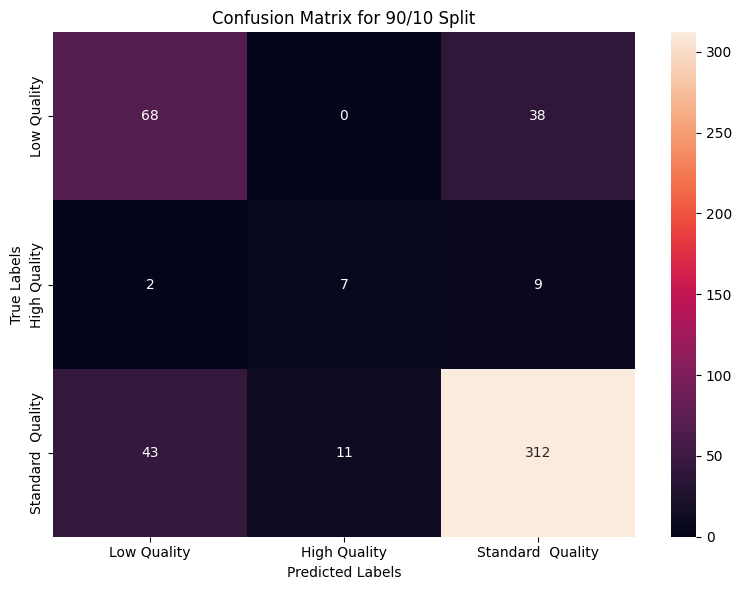

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

def plot_confusion_matrix(conf_matrix, class_names, title="Confusion Matrix"):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.tight_layout()
    plt.show()

def evaluate_classifiers(classifiers, proportions, class_names):
    results = []
    for i, (clf, X_train, X_test, y_train, y_test) in enumerate(classifiers):
        proportion = proportions[i]
        y_pred = clf.predict(X_test)

        # Classification report and confusion matrix
        class_report = classification_report(y_test, y_pred, target_names=class_names)
        conf_matrix = confusion_matrix(y_test, y_pred)

        results.append((proportion, class_report, conf_matrix))
        print("Classification Report for ",{proportion}," Split :")
        print(class_report)

        print(conf_matrix)

        # Visualize confusion matrix
        plot_confusion_matrix(conf_matrix, class_names, title=f"Confusion Matrix for {proportion} Split")


        print()
        print()
        print()
    return results


evaluation_results = evaluate_classifiers(classifiers, proportions, ['Low Quality', 'High Quality', 'Standard  Quality'])


## 2.4 The depth and accuracy of a decision tree of the 80/20 dataset

### Summary

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.908252 to fit


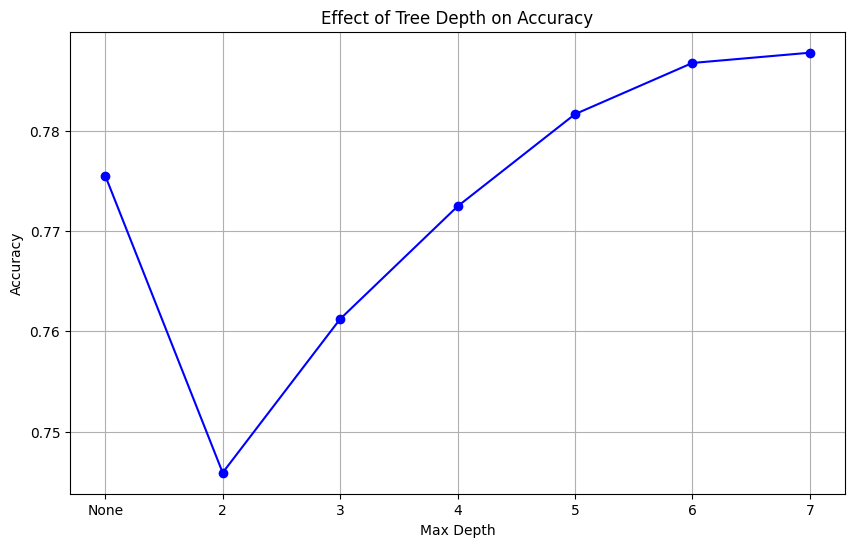

[0.7755102040816326, 0.7459183673469387, 0.7612244897959184, 0.7724489795918368, 0.7816326530612245, 0.786734693877551, 0.7877551020408163]


In [ ]:
from sklearn.metrics import accuracy_score

# Task 2.4 Implementation
def evaluate_depth_effect(X_train, X_test, y_train, y_test):
    depths = [None, 2, 3, 4, 5, 6, 7]
    accuracy_results = []
    for depth in depths:
        clf = DecisionTreeClassifier(criterion='entropy', max_depth=depth, random_state=42)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_results.append((depth, accuracy))

        # Get feature names from the training data
        feature_names = list(X_train.columns) #This line is added

        # Define class names (assuming binary classification)
        class_names = ['Low Quality', 'High Quality', 'Standard  Quality']

        # Visualize the decision tree
        dot_data = export_graphviz(clf, feature_names=feature_names, class_names=class_names, filled=True)
        graph = graphviz.Source(dot_data)
        graph.render(f"decision_tree_depth_{depth}", format="png", cleanup=True)

    # Plot accuracy vs. max_depth
    depths_labels = ["None" if d is None else str(d) for d in depths]
    accuracies = [acc[1] for acc in accuracy_results]
    plt.figure(figsize=(10, 6))
    plt.plot(depths_labels, accuracies, marker='o', linestyle='-', color='b')
    plt.title("Effect of Tree Depth on Accuracy")
    plt.xlabel("Max Depth")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.show()
    print(accuracies)

    return accuracy_results

X_train_80, X_test_80, y_train_80, y_test_80 = splits[2]
depth_effect_results = evaluate_depth_effect(X_train_80, X_test_80, y_train_80, y_test_80)


### Result of each depth

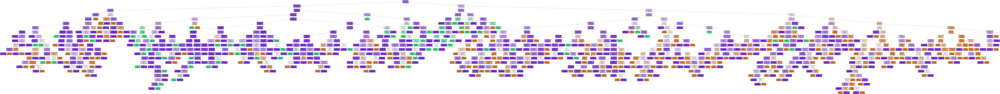

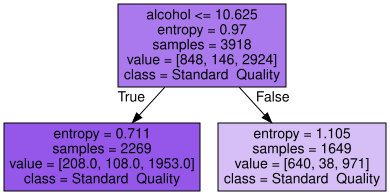

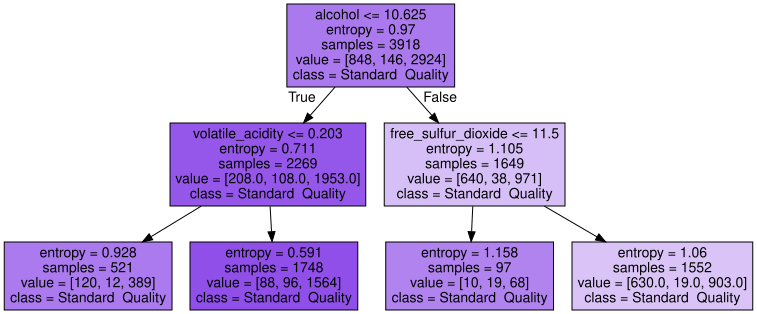

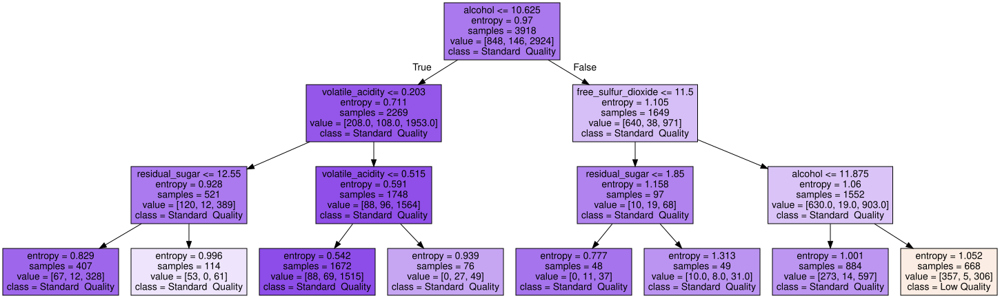

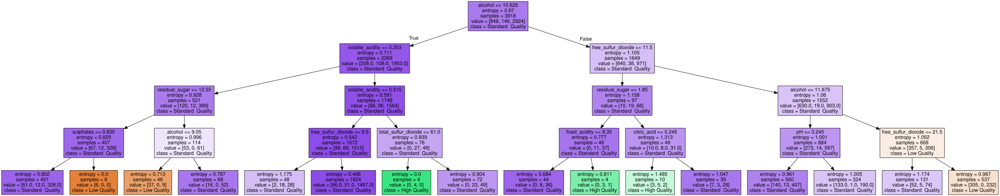

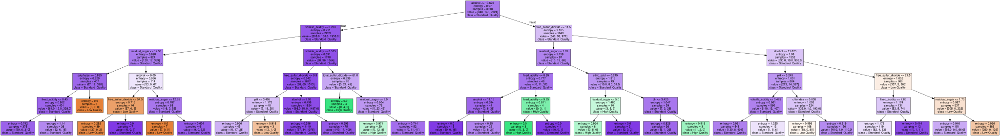

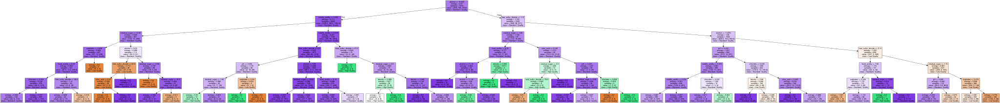

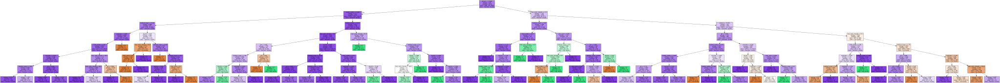

In [ ]:
from IPython.display import HTML

def build_and_visualize_decision_trees_with_depth(splits, proportions, max_depth=None):
    classifiers = []
    for i, (X_train, X_test, y_train, y_test) in enumerate(splits):
        proportion = proportions[i]
        clf = DecisionTreeClassifier(criterion='entropy', random_state=42, max_depth=max_depth)
        clf.fit(X_train, y_train)
        classifiers.append((clf, X_train, X_test, y_train, y_test))

        # Get feature names from the training data
        feature_names = list(X_train.columns)

        # Define class names (assuming binary classification)
        class_names = ['Low Quality', 'High Quality', 'Standard  Quality']

        # Visualize the decision tree
        dot_data = export_graphviz(
            clf,
            feature_names=feature_names,
            class_names=class_names,
            filled=True
        )

        pydot_graph = pydotplus.graph_from_dot_data(dot_data)

        if (setSizeOfGraph == 1):
          pydot_graph.set_size('"20,10!"')
        elif (setSizeOfGraph == 2):
          pydot_graph.set_size('"10,5!"')
        graph = graphviz.Source(pydot_graph.to_string())

        graph = graphviz.Source(dot_data)

        # Render inline in Jupyter Notebook with figure name
        figure_name = f"Decision tree for the {proportions[i]} datasets of depth {max_depth}"
        display(HTML(f"<h1 style='text-align: center; padding: 30px'>{figure_name}</h1>"))
        display(graph)  # Added figure_name for display

    return classifiers

build_and_visualize_decision_trees_with_depth([splits[2]], [proportions[2]],)

for i in range(1,8):
  build_and_visualize_decision_trees_with_depth([splits[2]], [proportions[2]], i)

## 2.5 The depth and accuracy of a decision tree of the other dataset

### 40/60 dataset

#### Summary

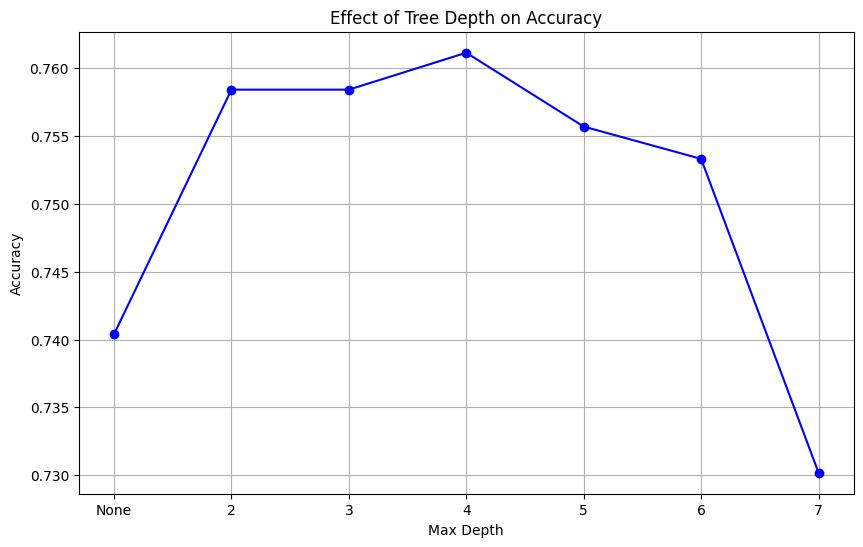

[0.7403878870364069, 0.7584212317114665, 0.7584212317114665, 0.7611432460020415, 0.7556992174208914, 0.7533174549166383, 0.7301803334467506]


In [ ]:
from sklearn.metrics import accuracy_score

X_train_80, X_test_80, y_train_80, y_test_80 = splits[0]
depth_effect_results = evaluate_depth_effect(X_train_80, X_test_80, y_train_80, y_test_80)


#### Result of each depth

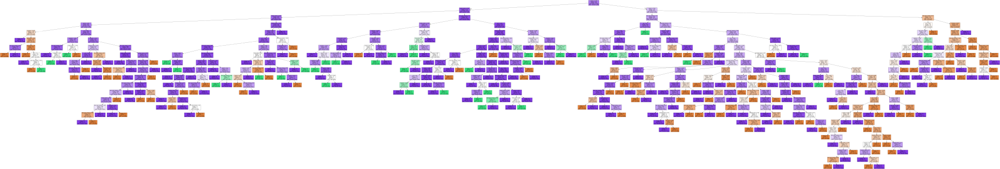

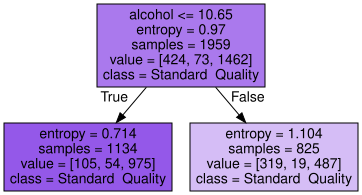

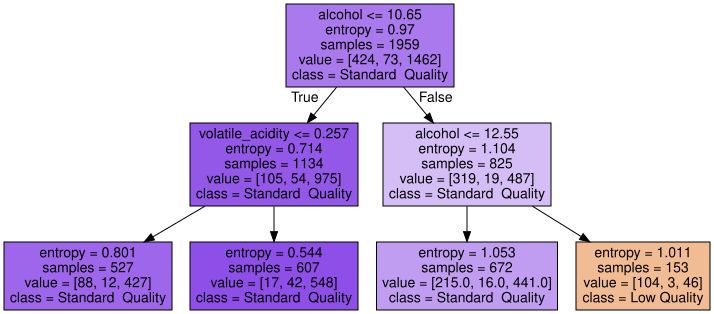

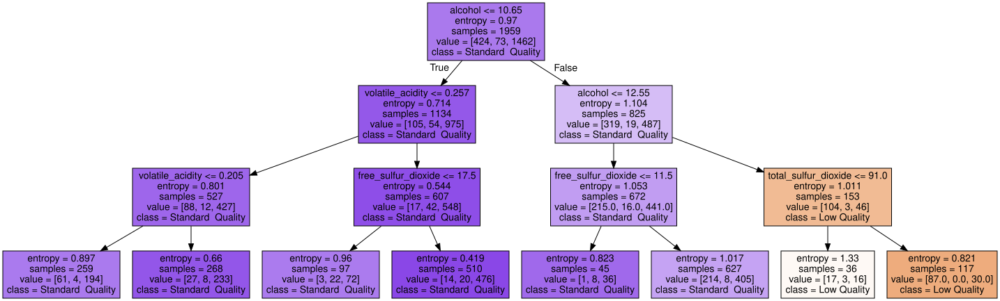

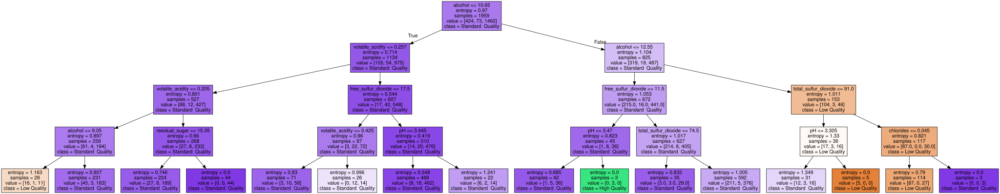

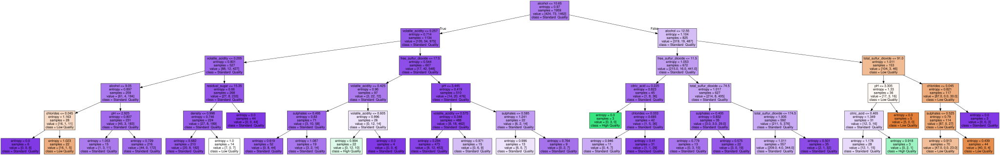

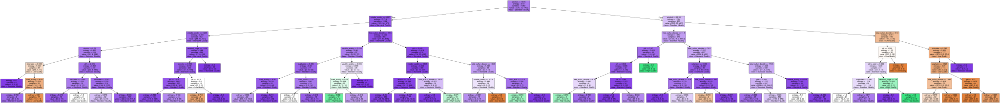

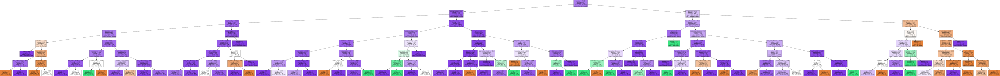

In [ ]:
from IPython.display import HTML

build_and_visualize_decision_trees_with_depth([splits[0]], [proportions[0]],)

for i in range(1,8):
  build_and_visualize_decision_trees_with_depth([splits[0]], [proportions[0]], i)

### 60/40 dataset

#### Summary

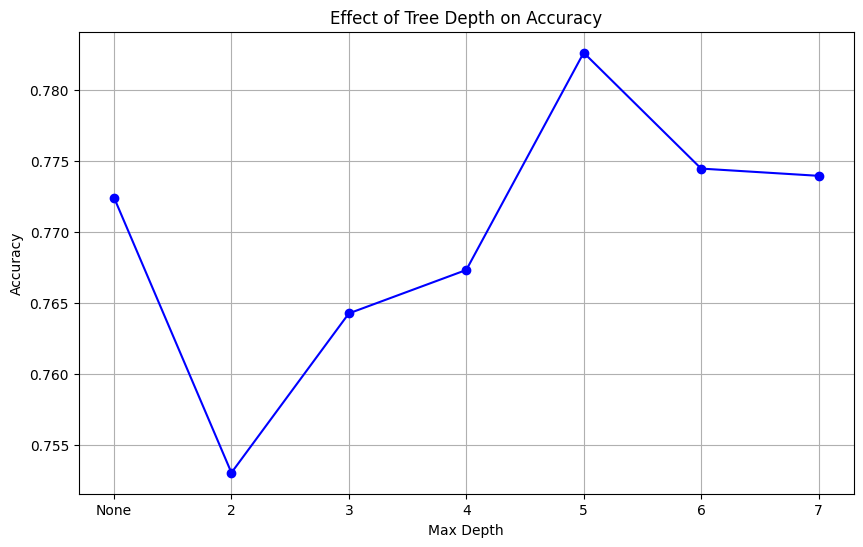

[0.7724489795918368, 0.753061224489796, 0.7642857142857142, 0.7673469387755102, 0.7826530612244897, 0.7744897959183673, 0.7739795918367347]


In [ ]:
from sklearn.metrics import accuracy_score

X_train_80, X_test_80, y_train_80, y_test_80 = splits[1]
depth_effect_results = evaluate_depth_effect(X_train_80, X_test_80, y_train_80, y_test_80)


#### Result of each depth

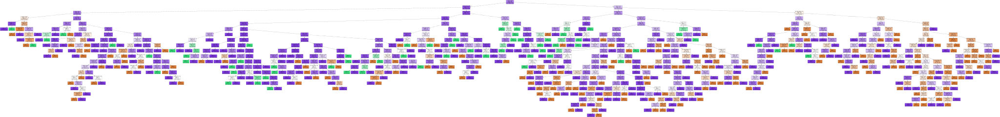

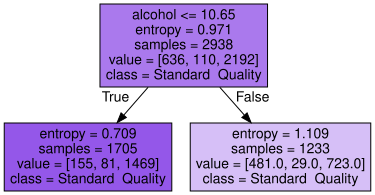

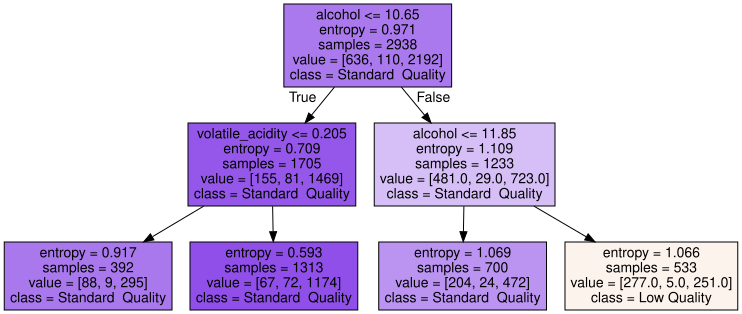

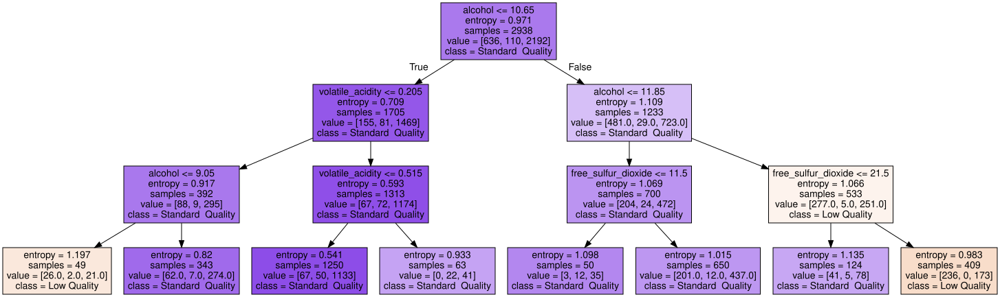

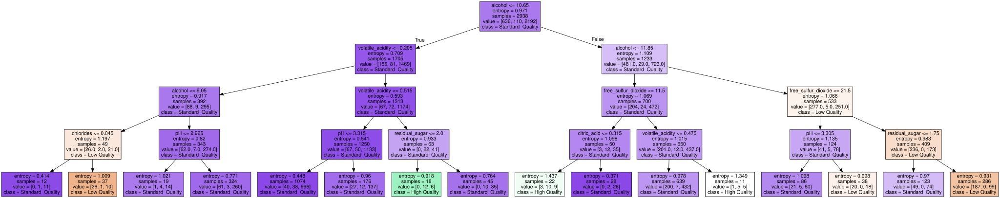

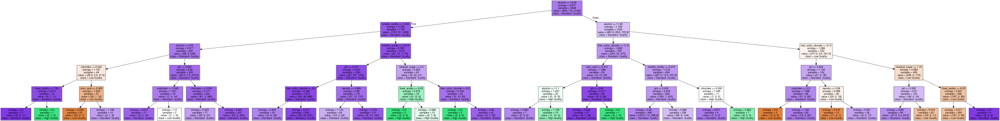

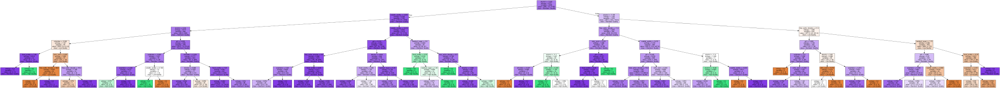

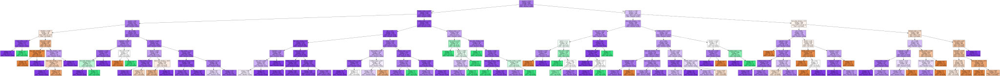

In [ ]:
from IPython.display import HTML

build_and_visualize_decision_trees_with_depth([splits[1]], [proportions[0]],)

for i in range(1,8):
  build_and_visualize_decision_trees_with_depth([splits[1]], [proportions[0]], i)

### 90/10 dataset

#### Summary

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.759955 to fit


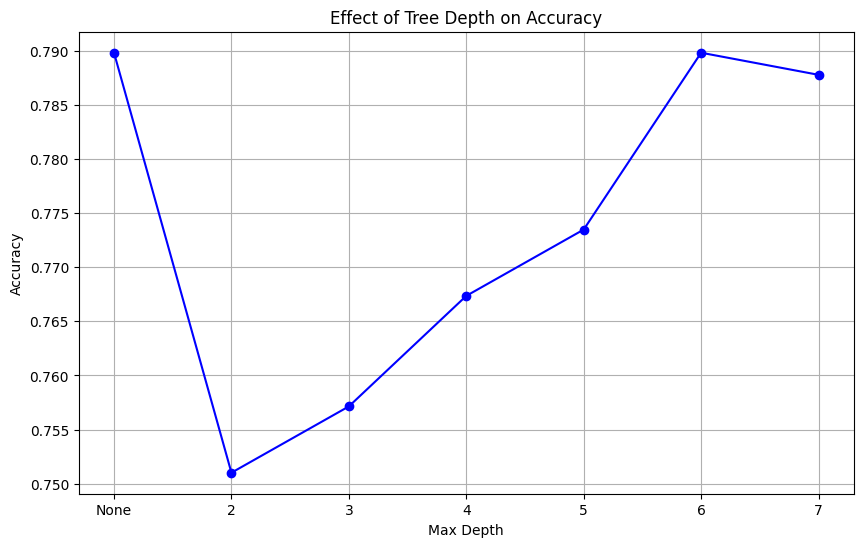

[0.789795918367347, 0.7510204081632653, 0.7571428571428571, 0.7673469387755102, 0.773469387755102, 0.789795918367347, 0.7877551020408163]


In [ ]:
from sklearn.metrics import accuracy_score

X_train_80, X_test_80, y_train_80, y_test_80 = splits[3]
depth_effect_results = evaluate_depth_effect(X_train_80, X_test_80, y_train_80, y_test_80)


#### Result of each depth

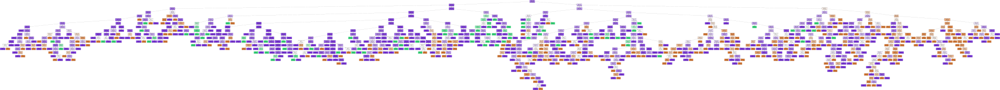

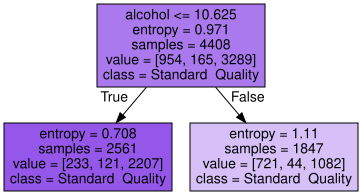

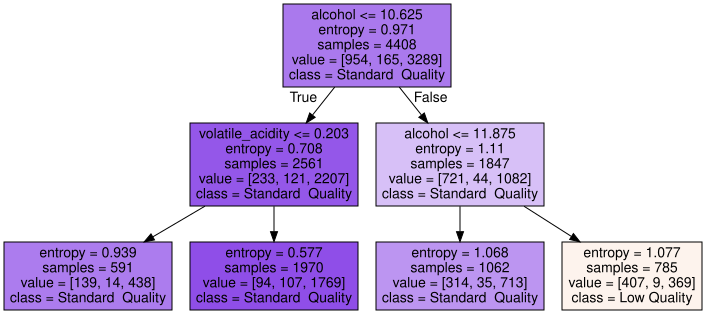

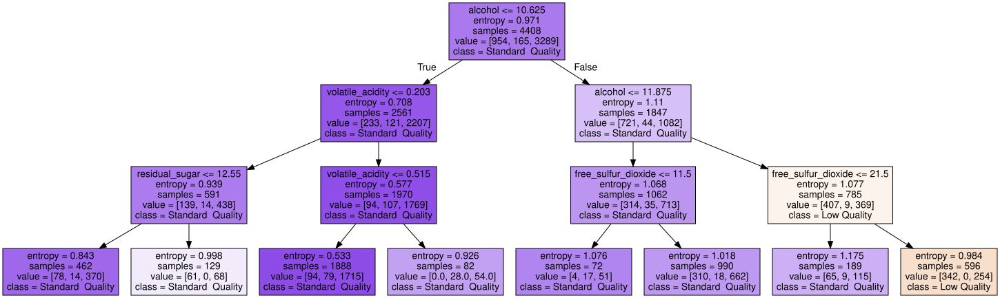

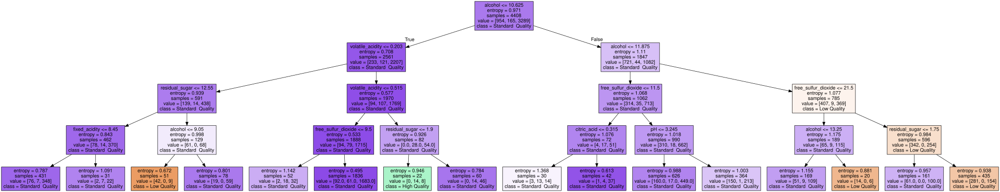

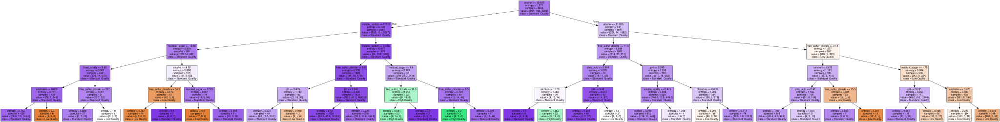

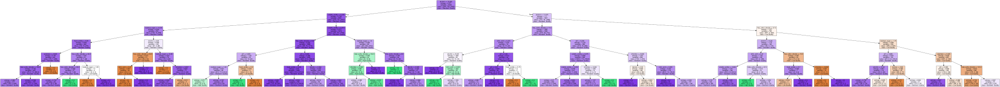

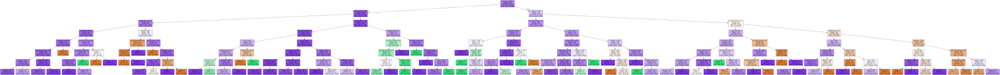

In [ ]:
from IPython.display import HTML

build_and_visualize_decision_trees_with_depth([splits[3]], [proportions[3]],)

for i in range(1,8):
  build_and_visualize_decision_trees_with_depth([splits[3]], [proportions[3]], i)

## Note: Run this in case the archive.ics server is down.

In [ ]:
# Replace the link with your shared link
shared_link = "https://drive.google.com/file/d/1JsTkSYWrvade92sh-uq1Qt42fcrAEwpo/view?usp=drive_link"

# Extract the file ID from the shared link
file_id = shared_link.split('/')[-2]

# Construct the direct download link
download_link = f"https://drive.google.com/uc?id={file_id}&export=download"

# Download the file
!wget -O file.zip "$download_link"

# Extract the ZIP file (if needed)
import zipfile

with zipfile.ZipFile("file.zip", 'r') as zip_ref:
    zip_ref.extractall()

--2024-12-15 15:55:39--  https://drive.google.com/uc?id=1JsTkSYWrvade92sh-uq1Qt42fcrAEwpo&export=download
Resolving drive.google.com (drive.google.com)... 209.85.145.138, 209.85.145.101, 209.85.145.113, ...
Connecting to drive.google.com (drive.google.com)|209.85.145.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1JsTkSYWrvade92sh-uq1Qt42fcrAEwpo&export=download [following]
--2024-12-15 15:55:39--  https://drive.usercontent.google.com/download?id=1JsTkSYWrvade92sh-uq1Qt42fcrAEwpo&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.201.132, 2607:f8b0:4001:c01::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.201.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69182 (68K) [application/octet-stream]
Saving to: ‘file.zip’

file.zip            100%[===================>]  67.56K  --.-KB/s    in 0s

In [ ]:
import pandas as pd
data = pd.read_csv('/content/wine-quality.csv')
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
features = data.drop(columns=['quality'])

features.head()

labels = data['quality']

labels.head()

,quality
0,6
1,6
2,6
3,6
4,6
